In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.cluster import (KMeans, AffinityPropagation, AgglomerativeClustering, Birch, DBSCAN, MiniBatchKMeans, MeanShift,
                             OPTICS, SpectralClustering)
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA


In [2]:
spot_df = pd.read_csv('data/spotify_playlist.csv')

In [3]:
spot_df.head()

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.325,0.720,122.494,249293,4
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.324,0.267,150.354,308560,4
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.119,0.172,64.223,179200,4
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.258,0.473,81.308,122067,4
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.394,0.781,122.875,224307,4


# Data Understanding

In [4]:
spot_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6514 entries, 0 to 6513
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            6513 non-null   object 
 1   artist_id         6514 non-null   object 
 2   popularity        6514 non-null   int64  
 3   album             6513 non-null   object 
 4   track_name        6513 non-null   object 
 5   track_id          6514 non-null   object 
 6   danceability      6514 non-null   float64
 7   energy            6514 non-null   float64
 8   key               6514 non-null   int64  
 9   loudness          6514 non-null   float64
 10  mode              6514 non-null   int64  
 11  speechiness       6514 non-null   float64
 12  instrumentalness  6514 non-null   float64
 13  liveness          6514 non-null   float64
 14  valence           6514 non-null   float64
 15  tempo             6514 non-null   float64
 16  duration_ms       6514 non-null   int64  


In [5]:
spot_df.describe()

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
count,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6514.000000,6.514000e+03,6514.000000
mean,38.185293,0.505411,0.718306,5.152748,-7.549406,0.672398,0.078551,0.138753,0.207243,0.502779,125.020099,2.247691e+05,3.934602
std,25.599819,0.164042,0.245218,3.565083,4.278693,0.469375,0.070419,0.287835,0.163056,0.243474,30.364398,7.749594e+04,0.321725
min,0.000000,0.072200,0.000685,0.000000,-41.932000,0.000000,0.022500,0.000000,0.009670,0.028600,36.172000,2.845500e+04,1.000000
25%,13.000000,0.391000,0.581000,2.000000,-9.526750,0.000000,0.037400,0.000000,0.096000,0.313000,100.621250,1.782718e+05,4.000000
50%,42.000000,0.503000,0.795000,5.000000,-6.363500,1.000000,0.052000,0.000124,0.143000,0.497000,122.998500,2.157000e+05,4.000000
75%,59.000000,0.619000,0.917000,8.000000,-4.615250,1.000000,0.088775,0.048575,0.290000,0.694000,144.746000,2.579930e+05,4.000000
max,89.000000,0.979000,0.999000,11.000000,-0.140000,1.000000,0.948000,0.994000,0.981000,0.995000,214.419000,1.050827e+06,5.000000


In [6]:
spot_df.shape

(6514, 18)

In [7]:
spot_df.isna().sum()

artist              1
artist_id           0
popularity          0
album               1
track_name          1
track_id            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
dtype: int64

In [8]:
 spot_df[spot_df.isna().any(axis=1)]

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
4400,NaN,0LyfQWJT6nXafLPZqxe9Of,0,NaN,NaN,0lMrWcrVXHPEuVBuc0nRzZ,0.804,0.758,4,-4.819,1,0.0483,0.331,0.125,0.424,127.946,230635,4


In [9]:
spot_df.dropna(inplace=True)

In [10]:
spot_df.isna().sum()

artist              0
artist_id           0
popularity          0
album               0
track_name          0
track_id            0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
dtype: int64

In [11]:
spot_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6513 entries, 0 to 6513
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artist            6513 non-null   object 
 1   artist_id         6513 non-null   object 
 2   popularity        6513 non-null   int64  
 3   album             6513 non-null   object 
 4   track_name        6513 non-null   object 
 5   track_id          6513 non-null   object 
 6   danceability      6513 non-null   float64
 7   energy            6513 non-null   float64
 8   key               6513 non-null   int64  
 9   loudness          6513 non-null   float64
 10  mode              6513 non-null   int64  
 11  speechiness       6513 non-null   float64
 12  instrumentalness  6513 non-null   float64
 13  liveness          6513 non-null   float64
 14  valence           6513 non-null   float64
 15  tempo             6513 non-null   float64
 16  duration_ms       6513 non-null   int64  


In [12]:
num_features = spot_df.select_dtypes(exclude=['object'])

In [13]:
num_features.drop(['time_signature', 'mode'], axis=1, inplace=True)

In [14]:
num_features

,popularity,danceability,energy,key,loudness,speechiness,instrumentalness,liveness,valence,tempo,duration_ms
0,8,0.534,0.887,0,-3.777,0.0345,0.000099,0.3250,0.720,122.494,249293
1,0,0.257,0.819,7,-3.562,0.0422,0.015000,0.3240,0.267,150.354,308560
2,64,0.268,0.459,7,-6.948,0.0346,0.000000,0.1190,0.172,64.223,179200
3,69,0.693,0.497,2,-7.316,0.1190,0.000000,0.2580,0.473,81.308,122067
4,0,0.556,0.945,0,-4.347,0.0496,0.000004,0.3940,0.781,122.875,224307
...,...,...,...,...,...,...,...,...,...,...,...
6509,63,0.894,0.698,6,-8.264,0.2750,0.000004,0.3290,0.695,98.104,336917
6510,42,0.852,0.705,2,-10.981,0.0582,0.000002,0.1260,0.833,104.556,246040
6511,70,0.665,0.910,6,-4.682,0.2230,0.000000,0.2270,0.887,84.099,293973
6512,66,0.634,0.845,11,-5.058,0.3520,0.000005,0.0598,0.929,94.000,237027


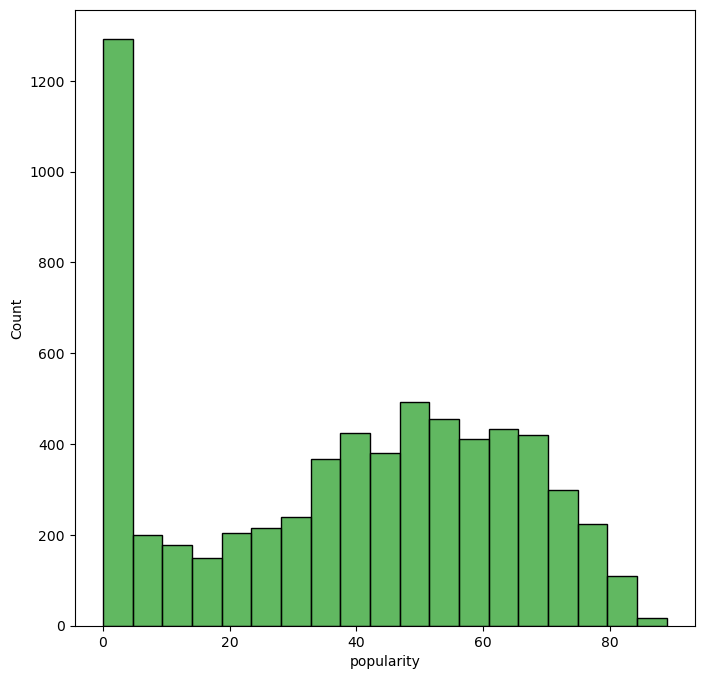

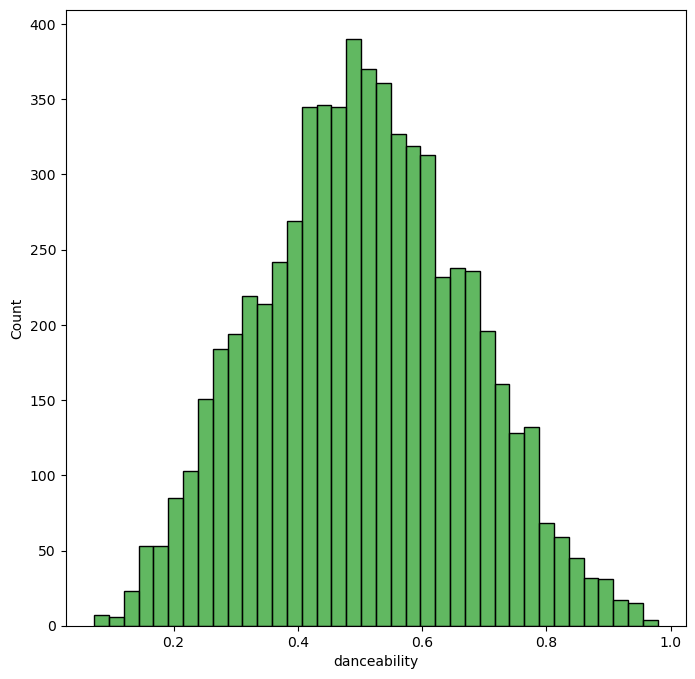

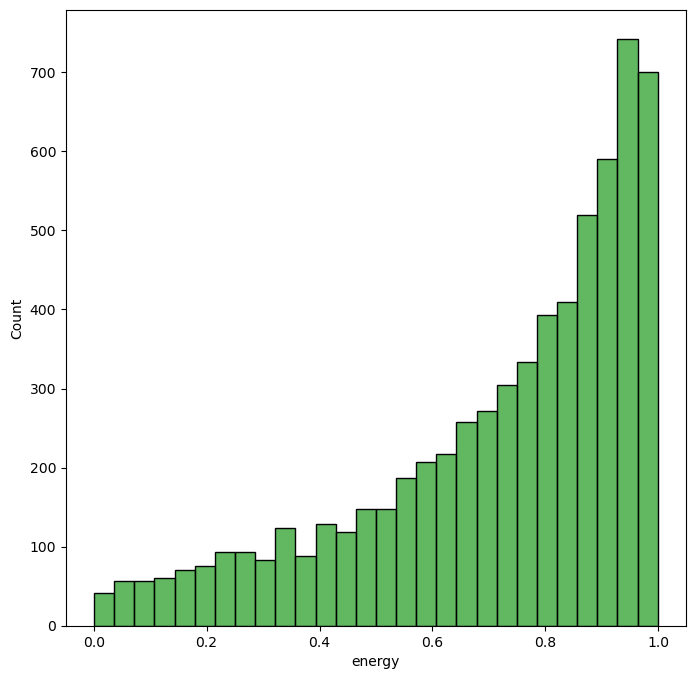

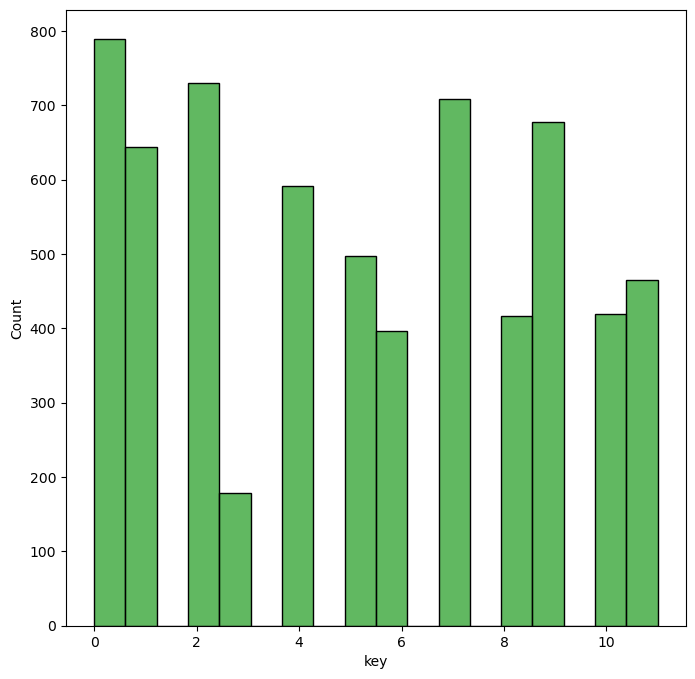

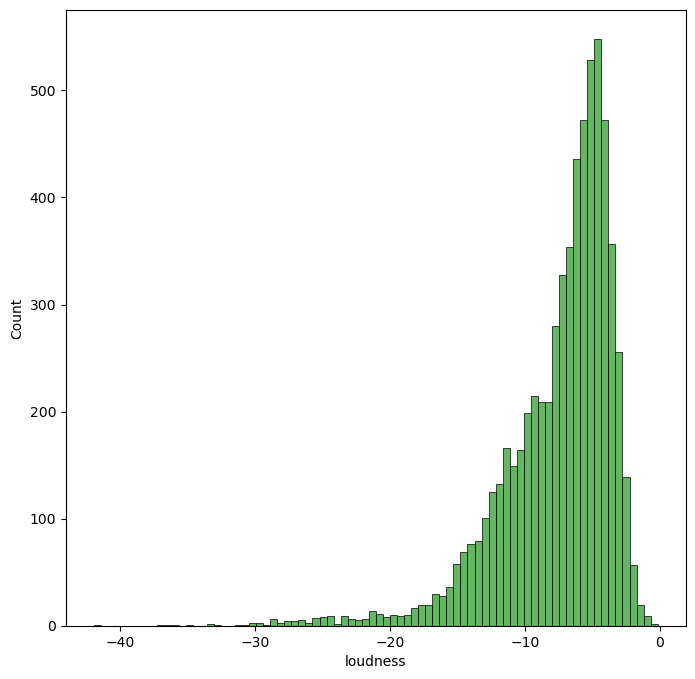

...

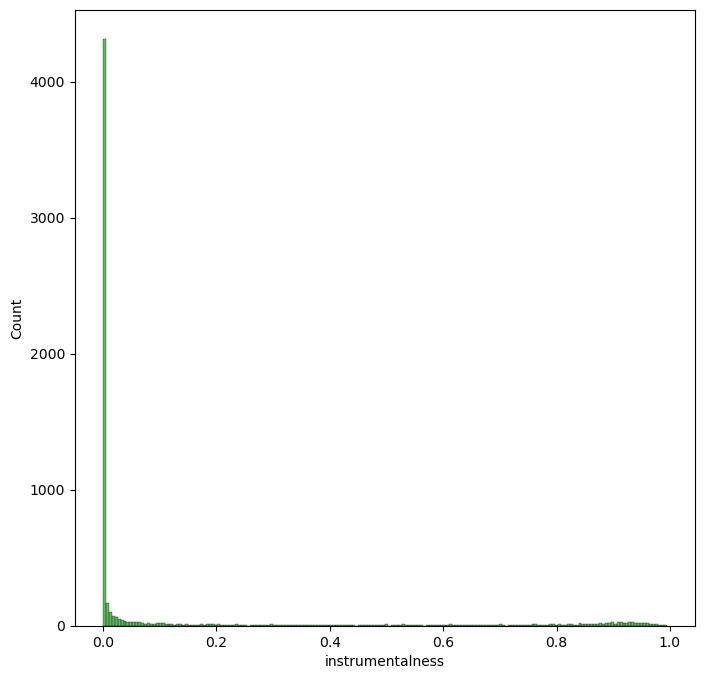

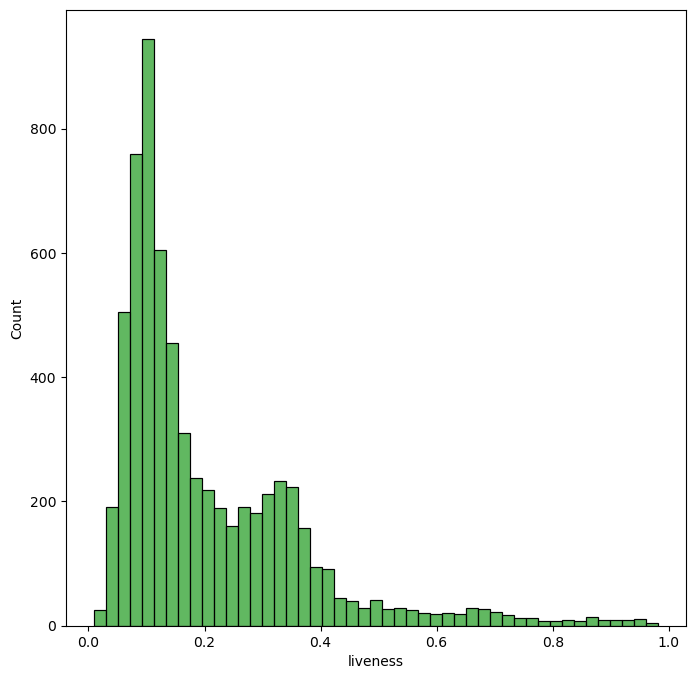

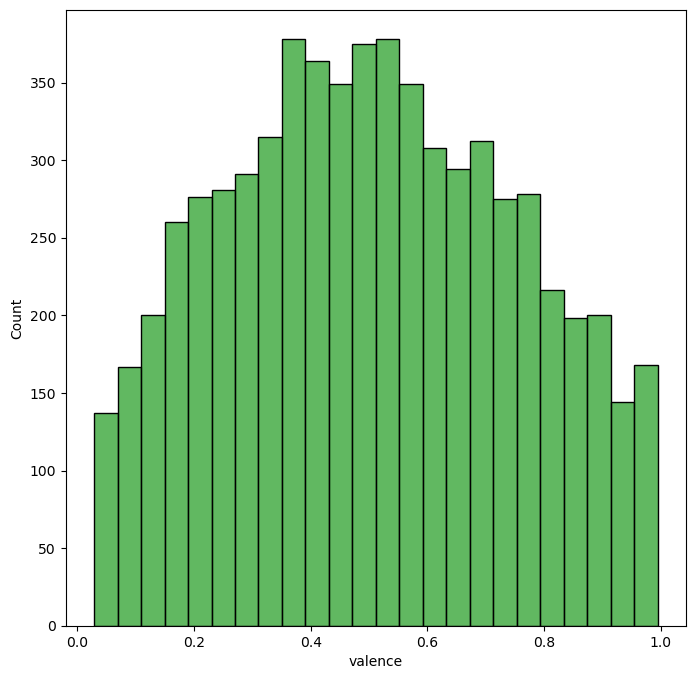

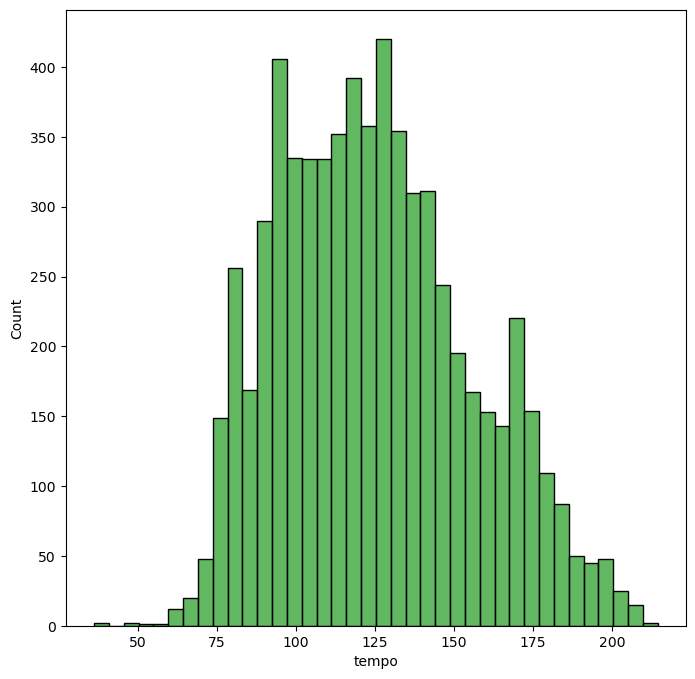

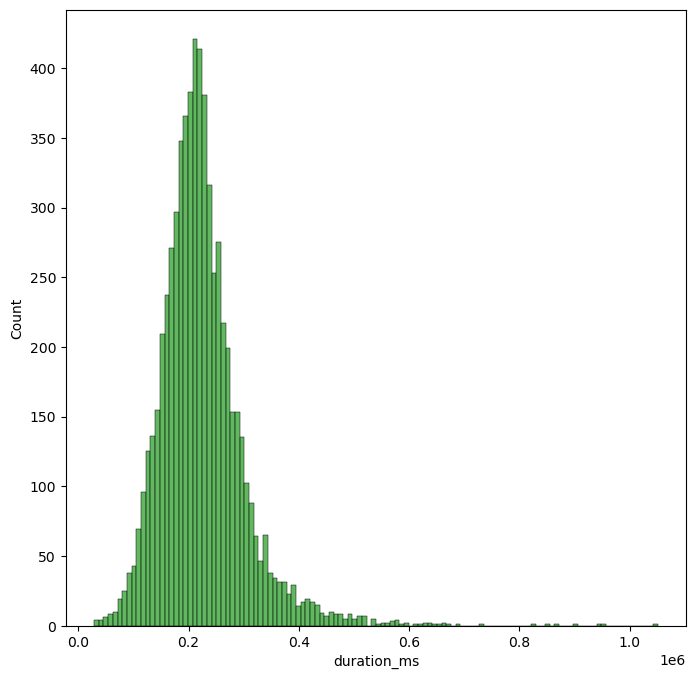

In [15]:
for col in num_features:
    fig, axes = plt.subplots(figsize = (8,8))
    sns.histplot(x=col, data = num_features, color="tab:green")

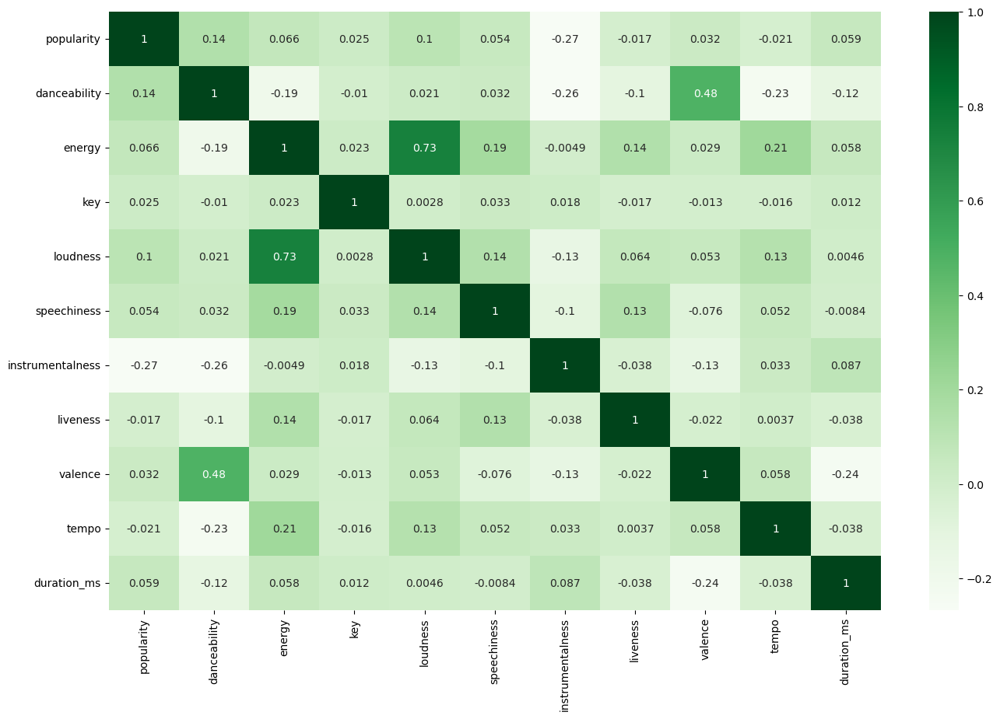

In [16]:
fig, ax = plt.subplots(figsize=(16, 10))
sns.heatmap(num_features.corr(), cmap ="Greens", annot=True);

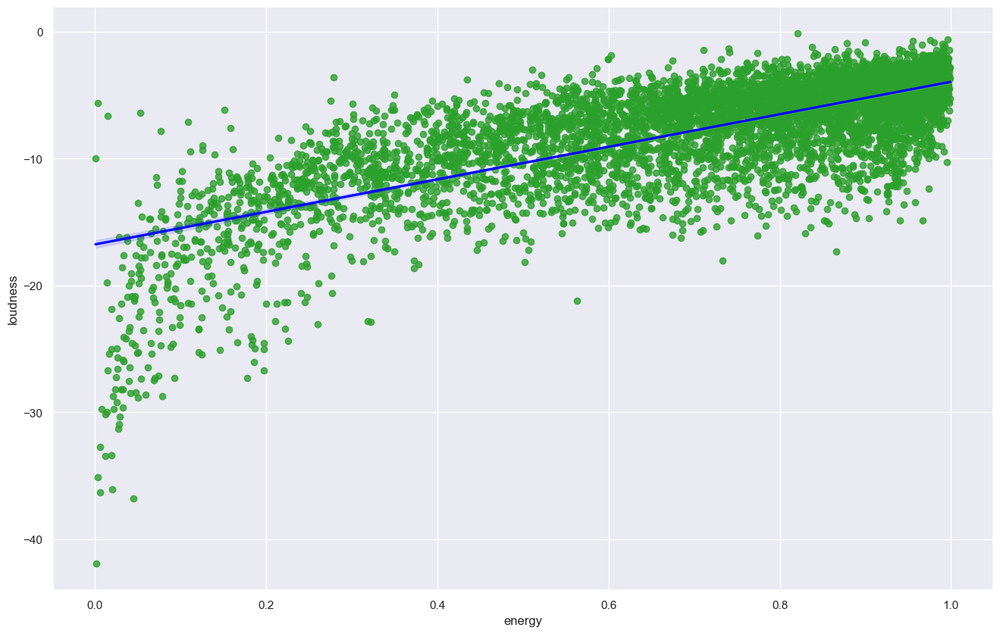

In [17]:
sns.set_theme(color_codes=True)
plt.subplots(figsize=(16,10))
sns.regplot(x = 'energy', y = 'loudness', data=spot_df, scatter_kws={"color": "tab:green"}, line_kws={"color": "blue"});

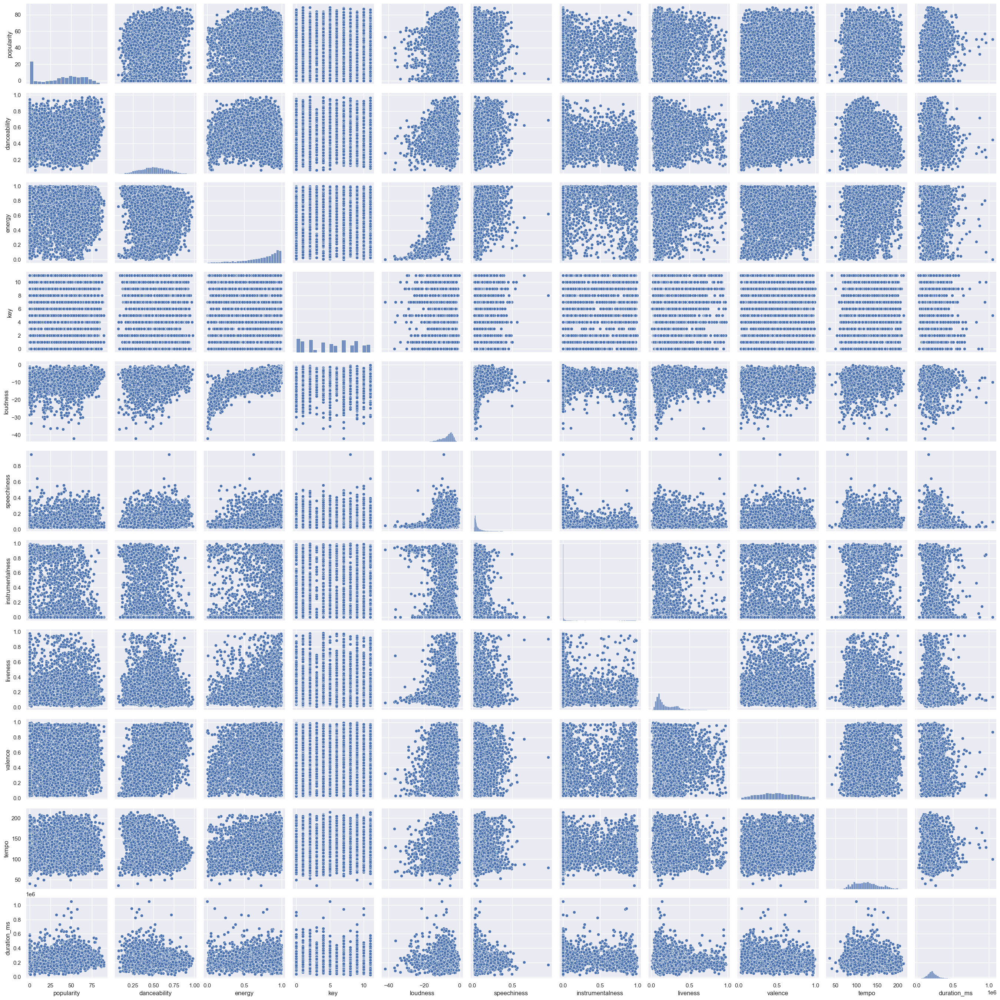

In [18]:
sns.pairplot(num_features);

In [19]:
print("Top 50 Songs means\n --------------------------- \n" , num_features.sort_values(['popularity']).head(50).mean())
print("\n")
print("Bottom 50 songs means\n --------------------------- \n", num_features.sort_values(['popularity']).tail(50).mean())

Top 50 Songs means
 --------------------------- 
 popularity               0.000000
danceability             0.543240
energy                   0.793400
key                      3.980000
loudness                -5.560980
speechiness              0.078846
instrumentalness         0.047895
liveness                 0.205490
valence                  0.474420
tempo                  124.068260
duration_ms         223022.000000
dtype: float64


Bottom 50 songs means
 --------------------------- 
 popularity              84.400000
danceability             0.627200
energy                   0.675220
key                      5.520000
loudness                -6.315100
speechiness              0.093498
instrumentalness         0.026515
liveness                 0.165008
valence                  0.525280
tempo                  121.484640
duration_ms         235406.760000
dtype: float64


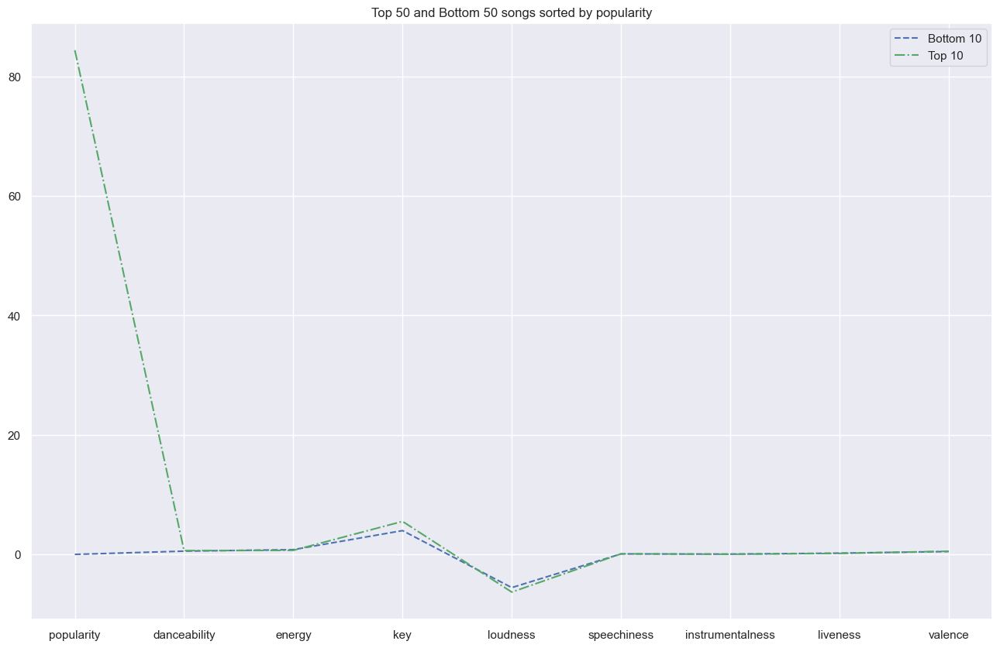

In [20]:
fig, ax = plt.subplots(figsize=(16, 10))
plt.title('Top 50 and Bottom 50 songs sorted by popularity')
plt.plot(num_features.sort_values(['popularity']).head(50).drop(['duration_ms', 'tempo'], axis=1).mean(),
         color = "b", linestyle = '--')
plt.plot(num_features.sort_values(['popularity']).tail(50).drop(['duration_ms', 'tempo'], axis=1).mean(),
         color = "g", linestyle = "dashdot")
plt.legend(labels = ["Bottom 10", "Top 10"]);

In [21]:
rec_df = spot_df.copy()
rec_df.head()

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.325,0.720,122.494,249293,4
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.324,0.267,150.354,308560,4
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.119,0.172,64.223,179200,4
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.258,0.473,81.308,122067,4
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.394,0.781,122.875,224307,4


In [22]:
# Creating df with just the audio features
rec_df_features = rec_df.select_dtypes(np.number)

In [23]:
rec_df_features.head()

,popularity,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature
0,8,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.325,0.720,122.494,249293,4
1,0,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.324,0.267,150.354,308560,4
2,64,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.119,0.172,64.223,179200,4
3,69,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.258,0.473,81.308,122067,4
4,0,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.394,0.781,122.875,224307,4


### Building Recommendation System}|

#### Using KMeans

In [24]:
# https://towardsdatascience.com/how-to-build-an-amazing-music-recommendation-system-4cce2719a572
song_cluster_pipeline = Pipeline([('scaler', StandardScaler()), 
                                  ('kmeans', KMeans(n_clusters=20, 
                                   verbose=2))],verbose=True)

songs = rec_df_features
song_cluster_pipeline.fit(songs)
song_cluster_labels = song_cluster_pipeline.predict(songs)
rec_df['cluster_label'] = song_cluster_labels

[Pipeline] ............ (step 1 of 2) Processing scaler, total=   0.0s
Initialization complete
Iteration 0, inertia 59819.855518314194.
Iteration 1, inertia 47281.61604465698.
Iteration 2, inertia 45656.33310004663.
Iteration 3, inertia 44989.12999057399.
Iteration 4, inertia 44477.640914229334.
Iteration 5, inertia 43878.281268680665.
Iteration 6, inertia 43407.04731051899.
Iteration 7, inertia 42942.5781454055.
Iteration 8, inertia 42378.9339531216.
Iteration 9, inertia 41993.768253257556.
Iteration 10, inertia 41870.24573778487.
Iteration 11, inertia 41820.720712288865.
Iteration 12, inertia 41787.918414992055.
Iteration 13, inertia 41768.28365528943.
Iteration 14, inertia 41755.49488447758.
Iteration 15, inertia 41747.22843230066.
Iteration 16, inertia 41736.227410044674.
Iteration 17, inertia 41727.0792970719.
Iteration 18, inertia 41720.12676972823.
Iteration 19, inertia 41714.621554401885.
Iteration 20, inertia 41712.405553721146.
Iteration 21, inertia 41709.43623556258.
Iterati

Iteration 15, inertia 41628.65752161539.
Iteration 16, inertia 41593.20728061575.
Iteration 17, inertia 41562.00273888322.
Iteration 18, inertia 41543.37839207923.
Iteration 19, inertia 41530.10600161164.
Iteration 20, inertia 41515.74873057367.
Iteration 21, inertia 41500.826908001276.
Iteration 22, inertia 41487.78602565268.
Iteration 23, inertia 41476.61712165264.
Iteration 24, inertia 41466.684719631594.
Iteration 25, inertia 41459.230175291166.
Iteration 26, inertia 41452.15928222422.
Iteration 27, inertia 41445.852246105744.
Iteration 28, inertia 41442.140199411006.
Iteration 29, inertia 41439.575015227616.
Iteration 30, inertia 41438.32473656515.
Iteration 31, inertia 41437.03172990669.
Iteration 32, inertia 41435.88977250918.
Iteration 33, inertia 41435.29740780754.
Iteration 34, inertia 41434.87156483335.
Iteration 35, inertia 41434.594050369444.
Iteration 36, inertia 41434.35603482812.
Iteration 37, inertia 41434.14825959207.
Iteration 38, inertia 41433.72716192721.
Iteration

In [25]:
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline.fit_transform(songs)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = rec_df['track_name']
projection['cluster'] = rec_df['cluster_label']

In [26]:
projection

,x,y,title,cluster
0,-0.711418,-0.384347,Livin' On A Prayer,14.0
1,-0.890368,2.047956,Wanted Dead Or Alive,9.0
2,0.802592,0.515847,We Are The Champions - Remastered 2011,0.0
3,0.594247,-1.858423,We Will Rock You - Remastered 2011,17.0
4,-1.107159,-0.457797,You Give Love A Bad Name,19.0
...,...,...,...,...
6508,-0.867487,-1.994541,Blue Yodel No. 9 - 1996 Remastered,16.0
6509,0.892233,-2.349170,Gangsta Gangsta,12.0
6510,-1.648051,-1.813193,Rollin' With My Homies,17.0
6511,-1.851511,-1.970760,N.Y. State of Mind,12.0


In [27]:
import plotly.express as px
fig = px.scatter(projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

#### Using Affinity Propagation

In [28]:
ap_song_cluster_pipeline = Pipeline(steps = [('scaler', StandardScaler()), 
                                  ('ap', AffinityPropagation())])


ap_song_cluster_pipeline.fit(songs)
song_cluster_labels = ap_song_cluster_pipeline.predict(songs)
rec_df['cluster_label'] = song_cluster_labels

In [29]:
pca_pipeline_2 = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
song_embedding = pca_pipeline_2.fit_transform(songs)
projection_2 = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection_2['title'] = rec_df['track_name']
projection_2['cluster'] = rec_df['cluster_label']

In [30]:
import plotly.express as px
fig = px.scatter(projection_2, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [31]:
projection_2.head()

,x,y,title,cluster
0,-0.711507,-0.384231,Livin' On A Prayer,65.0
1,-0.890836,2.048565,Wanted Dead Or Alive,7.0
2,0.801742,0.516948,We Are The Champions - Remastered 2011,121.0
3,0.593929,-1.858015,We Will Rock You - Remastered 2011,268.0
4,-1.107076,-0.457903,You Give Love A Bad Name,146.0


#### Using Agglomerative Clustering

In [32]:
def baseline_clustering_pipeline(scaler, model, df):
    song_cluster_pipeline = Pipeline(steps = [('scaler', scaler),
                                              ('cluster_model', model)])
       
    songs = df.select_dtypes(np.number)   
    song_cluster_labels = song_cluster_pipeline.fit_predict(songs)
    df['cluster_label'] = song_cluster_labels
    return df
    

In [33]:
def PCA_pipeline(scaler, df):
    pca_pipeline = Pipeline([('scaler', scaler), ('PCA', PCA(n_components=2))])
    songs = df.select_dtypes(np.number) 
    song_embedding = pca_pipeline.fit_transform(songs)
    projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
    projection['artist'] = df['artist']
    projection['title'] = df['track_name']
    projection['cluster'] = df['cluster_label']
    return projection

In [34]:
def plot_clusters(projection, x, y):
    fig = px.scatter(projection, x= 'x', y= 'y', color='cluster', hover_data=['x', 'y', 'title'])
    fig.show()

In [35]:
ac_df = baseline_clustering_pipeline(StandardScaler(), AgglomerativeClustering(n_clusters = 20), rec_df)

In [36]:
ac_df

,artist,artist_id,popularity,album,track_name,track_id,danceability,energy,key,loudness,mode,speechiness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,cluster_label
0,Bon Jovi,58lV9VcRSjABbAbfWS6skp,8,Slippery When Wet,Livin' On A Prayer,0J6mQxEZnlRt9ymzFntA6z,0.534,0.887,0,-3.777,1,0.0345,0.000099,0.3250,0.720,122.494,249293,4,12
1,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Bon Jovi Greatest Hits,Wanted Dead Or Alive,4Zj9VM4fO1KwkU3lFaECsW,0.257,0.819,7,-3.562,1,0.0422,0.015000,0.3240,0.267,150.354,308560,4,16
2,Queen,1dfeR4HaWDbWqFHLkxsg1d,64,News Of The World (Deluxe Remastered Version),We Are The Champions - Remastered 2011,7ccI9cStQbQdystvc6TvxD,0.268,0.459,7,-6.948,0,0.0346,0.000000,0.1190,0.172,64.223,179200,4,2
3,Queen,1dfeR4HaWDbWqFHLkxsg1d,69,News Of The World (Deluxe Remastered Version),We Will Rock You - Remastered 2011,54flyrjcdnQdco7300avMJ,0.693,0.497,2,-7.316,1,0.1190,0.000000,0.2580,0.473,81.308,122067,4,5
4,Bon Jovi,58lV9VcRSjABbAbfWS6skp,0,Cross Road,You Give Love A Bad Name,7LBJui5MdjfCd8YZr4xaqA,0.556,0.945,0,-4.347,0,0.0496,0.000004,0.3940,0.781,122.875,224307,4,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6509,N.W.A.,4EnEZVjo3w1cwcQYePccay,63,Straight Outta Compton,Gangsta Gangsta,1pOIpxfrQ8AszXZdKR3aH3,0.894,0.698,6,-8.264,0,0.2750,0.000004,0.3290,0.695,98.104,336917,4,5
6510,Various Artists,3y24n3XhZ96wgwRXjvS17T,42,Clueless / Original Motion Picture Soundtrack,Rollin' With My Homies,3qTiTZJJDM3gZ8TFiMMr0j,0.852,0.705,2,-10.981,1,0.0582,0.000002,0.1260,0.833,104.556,246040,4,8
6511,Nas,20qISvAhX20dpIbOOzGK3q,70,Illmatic,N.Y. State of Mind,0trHOzAhNpGCsGBEu7dOJo,0.665,0.910,6,-4.682,0,0.2230,0.000000,0.2270,0.887,84.099,293973,4,5
6512,Nas,20qISvAhX20dpIbOOzGK3q,66,I Am...,Nas Is Like,3gY6tiCNsuVi6s8kPV6aQg,0.634,0.845,11,-5.058,0,0.3520,0.000005,0.0598,0.929,94.000,237027,4,5


In [37]:
projection_3 = PCA_pipeline(StandardScaler(), ac_df)

In [38]:
projection_3

,x,y,artist,title,cluster
0,-0.607364,-0.168422,Bon Jovi,Livin' On A Prayer,12.0
1,-0.283324,2.406211,Bon Jovi,Wanted Dead Or Alive,16.0
2,0.692647,0.266059,Queen,We Are The Champions - Remastered 2011,2.0
3,0.268527,-1.963908,Queen,We Will Rock You - Remastered 2011,5.0
4,-1.190026,-0.333271,Bon Jovi,You Give Love A Bad Name,7.0
...,...,...,...,...,...
6508,-1.143839,-1.849366,Louis Armstrong,Blue Yodel No. 9 - 1996 Remastered,13.0
6509,0.580105,-2.435769,N.W.A.,Gangsta Gangsta,5.0
6510,-1.890369,-1.571459,Various Artists,Rollin' With My Homies,8.0
6511,-2.089244,-1.679429,Nas,N.Y. State of Mind,5.0


In [39]:
plot_clusters(projection_3, 'x', 'y')

In [40]:
cluster_19 = projection.loc[projection['cluster'] == 19]

In [41]:
cluster_19.columns

Index(['x', 'y', 'title', 'cluster'], dtype='object')

In [42]:
def dist(row):
    x = row['x']
    y = row['y']
    distance=np.sqrt((xt-x)**2 + (yt-y)**2)
    return distance

xt = cluster_19.loc[cluster_19['title'] == "Don't Stop Me Now - Remastered 2011", 'x']
yt = cluster_19.loc[cluster_19['title'] == "Don't Stop Me Now - Remastered 2011", 'y']

cluster_19['distance'] = cluster_19.apply(dist, axis=1)

C:\Users\Jonathan\AppData\Local\Temp\ipykernel_10172\2101716783.py:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [43]:
cluster_19

,x,y,title,cluster,distance
4,-1.107159,-0.457797,You Give Love A Bad Name,19.0,NaN
8,0.121935,-0.068805,Enter Sandman,19.0,NaN
11,-0.723295,-0.539888,Du hast,19.0,NaN
15,-0.845378,-0.243398,Love Chaser,19.0,NaN
22,0.581316,-1.684137,I Love Rock 'n' Roll,19.0,NaN
...,...,...,...,...,...
6388,1.066597,-1.223433,Stjärntecken,19.0,NaN
6390,0.300460,-1.808671,Gå in,19.0,NaN
6391,-0.438872,-1.575160,163 För Evigt (feat. Kehlani) [Remix],19.0,NaN
6393,1.581399,0.723982,Hon få mig - Remix,19.0,NaN


In [44]:
projection['distance'] = projection.apply(dist, axis=1)

In [45]:
projection.sort_values('distance')[:10]

IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
xt = projection.loc[projection['title'] == "Livin' On A Prayer", 'x']
yt = projection.loc[projection['title'] == "Livin' On A Prayer", 'y']

projection['distance'] = projection.apply(dist, axis=1)
projection.sort_values('distance')[0:10]